In [1]:
import os
import numpy as np
from os import listdir
from xml.etree import ElementTree
from numpy import zeros
from numpy import asarray
from numpy import expand_dims
from numpy import mean
import pydicom
import random
import matplotlib.pyplot as plt
import glob
import matplotlib.patches as patches

In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = '5,6'                        
import tensorflow as tf
import keras.backend as K
K.tensorflow_backend._get_available_gpus()

Using TensorFlow backend.
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\E.Lavrova\AppData\Local\conda\conda\envs\lisa\lib\site-packages\IPython\core\interactiveshell.py", line 3326, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-2-e498c9f373fa>", line 5, in <module>
    import keras.backend as K
  File "C:\Users\E.Lavrova\AppData\Local\conda\conda\envs\lisa\lib\site-packages\keras\__init__.py", line 3, in <module>
    from . import utils
  File "C:\Users\E.Lavrova\AppData\Local\conda\conda\envs\lisa\lib\site-packages\keras\utils\__init__.py", line 27, in <module>
    from .multi_gpu_utils import multi_gpu_model
  File "C:\Users\E.Lavrova\AppData\Local\conda\conda\envs\lisa\lib\site-packages\keras\utils\multi_gpu_utils.py", line 7, in <module>
    from ..layers.merge import concatenate
  File "C:\Users\E.Lavrova\AppData\Local\conda\conda\envs\lisa\lib\site-packages\keras\layers\__init__.py", line 4, in <module>
    from ..engine.base_layer import Layer
  File "C:\U

AttributeError: module 'tensorflow._api.v1.compat.v2' has no attribute '__internal__'

In [ ]:
import os
import numpy as np

from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from keras.layers.merge import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")



from tqdm import tqdm_notebook, tnrange
from itertools import chain
from sklearn.model_selection import train_test_split
from skimage.transform import resize

In [ ]:
import cv2

In [ ]:
from skimage import morphology

In [ ]:
images = glob.glob('Z:/Lisa/PARISK/PARISK-XNAT/plaque_converted_unempty slices/*/T1W_*.dcm')
contours = glob.glob('Z:/Lisa/PARISK/PARISK-XNAT/plaque_converted_unempty slices/*/MASSExport/*.dcm')

In [ ]:
len(images), len(contours)

In [9]:
sub_names_list = []
for image in images:
    sub_name = image.split(os.sep)[1].split('_')[0]
    con_names = glob.glob(os.path.join(os.path.split(image)[0],'MASSExport')+os.sep+'*'+ image.split(os.sep)[2][-10:-4]+'*.dcm')
    if len(con_names)>0:
        sub_names_list.append(sub_name)
        
sub_names = np.unique(sub_names_list)

In [10]:
sub_names_amc = []
sub_names_mumc = []
sub_names_umcu = []

for sub_name in sub_names:
    if 'AMC' in sub_name:
        sub_names_amc.append(sub_name)
    if 'MUMC' in sub_name:
        sub_names_mumc.append(sub_name)
    if 'UMCU' in sub_name:
        sub_names_umcu.append(sub_name)
        
print (len(sub_names_amc), len(sub_names_mumc), len(sub_names_umcu))

17 122 32


In [11]:
print (0.15*len(sub_names_amc), 0.15*len(sub_names_mumc), 0.15*len(sub_names_umcu))
print (0.7*len(sub_names_amc), 0.7*len(sub_names_mumc), 0.7*len(sub_names_umcu))

2.55 18.3 4.8
11.899999999999999 85.39999999999999 22.4


|DS | Total  | Train    | Valid   | Test   |
|---:|:-------------|:-----------|:------|:------|
| AMC | 17  | 12       | 3   | 2     |
| MUMC | 122  | 85    | 19   | 18     |
| UMCU | 32  | 22    | 5   | 5     |
| Total | 171  | 119    | 27   | 25     |

In [12]:
sub_names_train = sub_names_amc[:12] + sub_names_mumc[:85] + sub_names_umcu[:22]
sub_names_valid = sub_names_amc[12:15] + sub_names_mumc[85:104] + sub_names_umcu[22:27]
sub_names_test = sub_names_amc[15:] + sub_names_mumc[104:] + sub_names_umcu[27:]

In [13]:
img_names_train = []
img_names_valid = []
img_names_test = []

for sub_name_train in sub_names_train:
    img_names_train.extend(glob.glob('Z:/Lisa/PARISK/PARISK-XNAT/plaque_converted_unempty slices/'+sub_name_train+'*/T1W_*.dcm'))

for sub_name_valid in sub_names_valid:
    img_names_valid.extend(glob.glob('Z:/Lisa/PARISK/PARISK-XNAT/plaque_converted_unempty slices/'+sub_name_valid+'*/T1W_*.dcm'))
    
for sub_name_test in sub_names_test:
    img_names_test.extend(glob.glob('Z:/Lisa/PARISK/PARISK-XNAT/plaque_converted_unempty slices/'+sub_name_test+'*/T1W_*.dcm'))
    
print (len(img_names_train), len(img_names_valid), len(img_names_test))

1785 405 375


In [14]:
im_side = 64
im_width = im_side
im_height = im_side
border = 5

In [15]:
X_train = np.zeros((len(img_names_train), 64, 64, 1), dtype = np.uint8)
y_train = np.zeros((len(img_names_train), 64, 64, 1), dtype = np.uint8)

X_valid = np.zeros((len(img_names_valid), 64, 64, 1), dtype = np.uint8)
y_valid = np.zeros((len(img_names_valid), 64, 64, 1), dtype = np.uint8)

X_test = np.zeros((len(img_names_test), 64, 64, 1), dtype = np.uint8)
y_test = np.zeros((len(img_names_test), 64, 64, 1), dtype = np.uint8)

In [16]:
def path2array(dcm_path):
    arr_dcm = pydicom.read_file(dcm_path, force = True)
    arr_dcm.file_meta.TransferSyntaxUID = pydicom.uid.ImplicitVRLittleEndian
    arr = arr_dcm.pixel_array
    return arr

In [17]:
def norm_crop(img_arr, con_arr, im_side):
    
    img_min = np.min(img_arr) #!!!
    img_max = np.max(img_arr) #!!!
    
    img_norm = np.copy((img_arr - img_min)/(img_max - img_min)*255).astype(np.uint8)

    con_xmin = np.min(np.where(con_arr > 0)[0])
    con_xmax = np.max(np.where(con_arr > 0)[0])
    con_ymin = np.min(np.where(con_arr > 0)[1])
    con_ymax = np.max(np.where(con_arr > 0)[1])
        
    side_x = con_xmax - con_xmin
    side_y = con_ymax - con_ymin

    crop_xmin = max(0, con_xmin-random.randint(2, max(2, im_side-side_x)))
    crop_ymin = max(0, con_ymin-random.randint(2, max(2, im_side-side_y)))
        
    #crop_xmin = con_xmin-random.randint(2,20)
    #crop_ymin = con_ymin-random.randint(2,20)
        
    #side = min(max(con_xmax-crop_xmin, con_ymax-crop_ymin)+random.randint(2,7), im_side)
    crop_xmax = crop_xmin + im_side
    crop_ymax = crop_ymin + im_side

    crop = [crop_xmin, crop_xmax, crop_ymin, crop_ymax]

    img_norm_crop = np.copy(img_norm[crop[0]:crop[1], crop[2]:crop[3]])
    con_crop = np.copy(con_arr[crop[0]:crop[1], crop[2]:crop[3]])

    #x_img = resize(img_norm_crop, (128, 128, 1), preserve_range = True, anti_aliasing=False)
    #mask = resize(con_crop, (128, 128, 1), preserve_range = True, anti_aliasing=False)
        
    #top = 0
    #bottom = 0
    #left = 0
    #right = 0
        
    #if img_norm_crop.shape[0] < 64:
    #    top = random.randrange(0, 64-img_norm_crop.shape[0])
    #    bottom = 64-img_norm_crop.shape[0]-top
    #if img_norm_crop.shape[1] < 64:
    #    left = random.randrange(0, 64-img_norm_crop.shape[1])
    #    right = 64-img_norm_crop.shape[1]-left
        
    #x_img = cv2.copyMakeBorder(img_norm_crop, top, bottom, left, right, cv2.BORDER_REPLICATE)
    #mask = cv2.copyMakeBorder(con_crop, top, bottom, left, right, cv2.BORDER_CONSTANT,value=0)

    return img_norm_crop, con_crop>0
    

In [18]:
def paths2dataarray(paths_list, X_array, y_array, im_side):
    
    i = 0

    for impth in paths_list:

        img = path2array(impth)
        con_name = glob.glob(os.path.join(os.path.split(impth)[0],'MASSExport')+os.sep+'*'+ impth.split(os.sep)[2][-10:-4]+'*.dcm')[0]
        con = path2array(con_name)
        
        img_min = np.min(img)
        img_max = np.max(img)

        if (np.sum(con)>0)&((img_max - img_min)>0):

            img_prep, con_prep = norm_crop(img, con, im_side)

            X_array[i, ..., 0] = img_prep
            y_array[i, ..., 0] = con_prep

            i+=1

    

In [19]:
paths2dataarray(img_names_train, X_train, y_train, 64)
paths2dataarray(img_names_valid, X_valid, y_valid, 64)
paths2dataarray(img_names_test, X_test, y_test, 64)

In [19]:
#for i in range (0, len(y_train)):
#    plt.imshow(X_train[i, ..., 0], cmap = 'bone')
#    plt.imshow(y_train[i, ..., 0], alpha = 0.3)
#    plt.axis('Off')
#    plt.show()

In [20]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
#X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [21]:
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    """Function to add 2 convolutional layers with the parameters passed to it"""
    # first layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # second layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)

    return x

def get_unet(input_img, n_filters = 8, dropout = 0.2, batchnorm = True):
    """Function to define the UNET Model"""
    # Contracting Path
    c1 = conv2d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(dropout)(p1)

    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(dropout)(p3)

    c4 = conv2d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(dropout)(p4)

    c5 = conv2d_block(p4, n_filters = n_filters * 16, kernel_size = 3, batchnorm = batchnorm)

    # Expansive Path
    u6 = Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)

    u7 = Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)

    u8 = Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)

    u9 = Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, c1])
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

In [22]:
def dice_coef(y_true, y_pred):
    from keras import backend as K
    smooth=1
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

In [23]:
def dice_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def custom_loss(y_true, y_pred):
    from keras.losses import binary_crossentropy
    return 0.5*keras.losses.binary_crossentropy(y_true,y_pred)+0.5*dice_loss(y_true,y_pred)

In [24]:
input_img = Input((im_height, im_width, 1), name='img')
model = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)

model.compile(optimizer=Adam(), loss=dice_loss, metrics=['accuracy', dice_coef])
model.summary()

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                (None, 64, 64, 1)    0                                            
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 64, 64, 16)   160         img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_2 (BatchNor (None, 64, 64, 16)   64          conv2d_2[0][0]                   
__________________________________________________________________________________________________
activation_2 (Activat

In [25]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=3, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model_vessel-detection.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

In [26]:
results = model.fit(X_train, y_train, batch_size=32, epochs=100, callbacks=callbacks, validation_data=(X_valid, y_valid))

Train on 1785 samples, validate on 405 samples
Epoch 1/100
1785/1785 [==============================] - ETA: 5:12 - loss: 0.7782 - acc: 0.6847 - dice_coef: 0.221 - ETA: 1:41 - loss: 0.7194 - acc: 0.6981 - dice_coef: 0.280 - ETA: 58s - loss: 0.7038 - acc: 0.6885 - dice_coef: 0.296 - ETA: 40s - loss: 0.6825 - acc: 0.7014 - dice_coef: 0.31 - ETA: 30s - loss: 0.6662 - acc: 0.7128 - dice_coef: 0.33 - ETA: 21s - loss: 0.6344 - acc: 0.7341 - dice_coef: 0.36 - ETA: 16s - loss: 0.6081 - acc: 0.7500 - dice_coef: 0.39 - ETA: 13s - loss: 0.5922 - acc: 0.7582 - dice_coef: 0.40 - ETA: 11s - loss: 0.5805 - acc: 0.7647 - dice_coef: 0.41 - ETA: 10s - loss: 0.5668 - acc: 0.7729 - dice_coef: 0.43 - ETA: 8s - loss: 0.5502 - acc: 0.7820 - dice_coef: 0.4498 - ETA: 7s - loss: 0.5387 - acc: 0.7876 - dice_coef: 0.461 - ETA: 6s - loss: 0.5271 - acc: 0.7942 - dice_coef: 0.472 - ETA: 5s - loss: 0.5205 - acc: 0.7973 - dice_coef: 0.479 - ETA: 4s - loss: 0.5126 - acc: 0.8011 - dice_coef: 0.487 - ETA: 4s - loss: 0.50

1785/1785 [==============================] - ETA: 1s - loss: 0.0872 - acc: 0.9716 - dice_coef: 0.912 - ETA: 1s - loss: 0.0839 - acc: 0.9699 - dice_coef: 0.916 - ETA: 1s - loss: 0.0837 - acc: 0.9692 - dice_coef: 0.916 - ETA: 1s - loss: 0.0824 - acc: 0.9706 - dice_coef: 0.917 - ETA: 1s - loss: 0.0816 - acc: 0.9711 - dice_coef: 0.918 - ETA: 1s - loss: 0.0813 - acc: 0.9712 - dice_coef: 0.918 - ETA: 0s - loss: 0.0827 - acc: 0.9703 - dice_coef: 0.917 - ETA: 0s - loss: 0.0830 - acc: 0.9702 - dice_coef: 0.917 - ETA: 0s - loss: 0.0827 - acc: 0.9701 - dice_coef: 0.917 - ETA: 0s - loss: 0.0833 - acc: 0.9700 - dice_coef: 0.916 - ETA: 0s - loss: 0.0829 - acc: 0.9701 - dice_coef: 0.917 - ETA: 0s - loss: 0.0826 - acc: 0.9704 - dice_coef: 0.917 - ETA: 0s - loss: 0.0821 - acc: 0.9708 - dice_coef: 0.917 - ETA: 0s - loss: 0.0823 - acc: 0.9706 - dice_coef: 0.917 - ETA: 0s - loss: 0.0821 - acc: 0.9706 - dice_coef: 0.917 - ETA: 0s - loss: 0.0820 - acc: 0.9707 - dice_coef: 0.918 - ETA: 0s - loss: 0.0829 - ac

1785/1785 [==============================] - ETA: 0s - loss: 0.0732 - acc: 0.9716 - dice_coef: 0.926 - ETA: 1s - loss: 0.0760 - acc: 0.9723 - dice_coef: 0.924 - ETA: 1s - loss: 0.0738 - acc: 0.9735 - dice_coef: 0.926 - ETA: 1s - loss: 0.0713 - acc: 0.9742 - dice_coef: 0.928 - ETA: 1s - loss: 0.0736 - acc: 0.9734 - dice_coef: 0.926 - ETA: 0s - loss: 0.0732 - acc: 0.9738 - dice_coef: 0.926 - ETA: 0s - loss: 0.0729 - acc: 0.9739 - dice_coef: 0.927 - ETA: 0s - loss: 0.0729 - acc: 0.9739 - dice_coef: 0.927 - ETA: 0s - loss: 0.0738 - acc: 0.9735 - dice_coef: 0.926 - ETA: 0s - loss: 0.0738 - acc: 0.9733 - dice_coef: 0.926 - ETA: 0s - loss: 0.0738 - acc: 0.9735 - dice_coef: 0.926 - ETA: 0s - loss: 0.0733 - acc: 0.9735 - dice_coef: 0.926 - ETA: 0s - loss: 0.0731 - acc: 0.9737 - dice_coef: 0.926 - ETA: 0s - loss: 0.0739 - acc: 0.9736 - dice_coef: 0.926 - ETA: 0s - loss: 0.0739 - acc: 0.9734 - dice_coef: 0.926 - ETA: 0s - loss: 0.0743 - acc: 0.9733 - dice_coef: 0.925 - ETA: 0s - loss: 0.0743 - ac

1785/1785 [==============================] - ETA: 0s - loss: 0.0647 - acc: 0.9776 - dice_coef: 0.935 - ETA: 1s - loss: 0.0717 - acc: 0.9743 - dice_coef: 0.928 - ETA: 1s - loss: 0.0765 - acc: 0.9733 - dice_coef: 0.923 - ETA: 1s - loss: 0.0756 - acc: 0.9736 - dice_coef: 0.924 - ETA: 0s - loss: 0.0751 - acc: 0.9732 - dice_coef: 0.924 - ETA: 0s - loss: 0.0759 - acc: 0.9729 - dice_coef: 0.924 - ETA: 0s - loss: 0.0756 - acc: 0.9730 - dice_coef: 0.924 - ETA: 0s - loss: 0.0770 - acc: 0.9723 - dice_coef: 0.923 - ETA: 0s - loss: 0.0763 - acc: 0.9725 - dice_coef: 0.923 - ETA: 0s - loss: 0.0758 - acc: 0.9730 - dice_coef: 0.924 - ETA: 0s - loss: 0.0757 - acc: 0.9730 - dice_coef: 0.924 - ETA: 0s - loss: 0.0753 - acc: 0.9734 - dice_coef: 0.924 - ETA: 0s - loss: 0.0755 - acc: 0.9734 - dice_coef: 0.924 - ETA: 0s - loss: 0.0756 - acc: 0.9734 - dice_coef: 0.924 - ETA: 0s - loss: 0.0754 - acc: 0.9734 - dice_coef: 0.924 - ETA: 0s - loss: 0.0754 - acc: 0.9734 - dice_coef: 0.924 - ETA: 0s - loss: 0.0752 - ac

1785/1785 [==============================] - ETA: 0s - loss: 0.0763 - acc: 0.9750 - dice_coef: 0.923 - ETA: 1s - loss: 0.0729 - acc: 0.9748 - dice_coef: 0.927 - ETA: 1s - loss: 0.0740 - acc: 0.9737 - dice_coef: 0.926 - ETA: 1s - loss: 0.0743 - acc: 0.9736 - dice_coef: 0.925 - ETA: 1s - loss: 0.0729 - acc: 0.9738 - dice_coef: 0.927 - ETA: 1s - loss: 0.0725 - acc: 0.9739 - dice_coef: 0.927 - ETA: 0s - loss: 0.0725 - acc: 0.9739 - dice_coef: 0.927 - ETA: 0s - loss: 0.0725 - acc: 0.9736 - dice_coef: 0.927 - ETA: 0s - loss: 0.0733 - acc: 0.9736 - dice_coef: 0.926 - ETA: 0s - loss: 0.0733 - acc: 0.9734 - dice_coef: 0.926 - ETA: 0s - loss: 0.0730 - acc: 0.9737 - dice_coef: 0.927 - ETA: 0s - loss: 0.0730 - acc: 0.9736 - dice_coef: 0.927 - ETA: 0s - loss: 0.0730 - acc: 0.9738 - dice_coef: 0.927 - ETA: 0s - loss: 0.0730 - acc: 0.9738 - dice_coef: 0.927 - ETA: 0s - loss: 0.0731 - acc: 0.9738 - dice_coef: 0.926 - ETA: 0s - loss: 0.0733 - acc: 0.9737 - dice_coef: 0.926 - ETA: 0s - loss: 0.0740 - ac

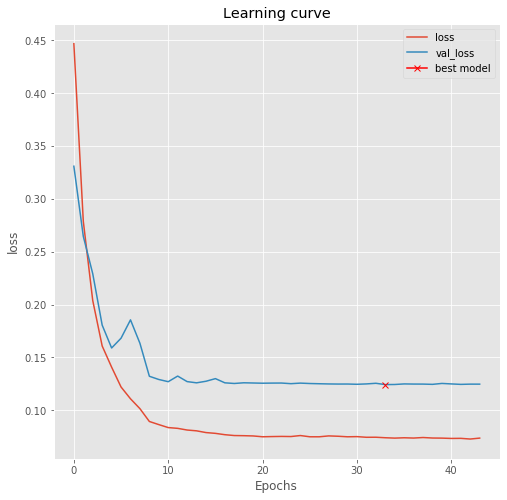

In [27]:
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("loss")
plt.legend();

In [366]:
model.load_weights('model_vessel-detection.h5')

In [367]:
model.evaluate(X_valid, y_valid, verbose=1)

405/405 [==============================] - ETA:  - ETA:  - 0s 262us/step


[0.11956421190205915, 0.9521466299339577, 0.8804357884842673]

In [368]:
model.evaluate(X_test, y_test, verbose=1)

375/375 [==============================] - ETA:  - ETA:  - 0s 349us/step


[0.12668916304906208, 0.9532949213981629, 0.8733108369509379]

In [369]:
# Predict on train, val and test
preds_test = model.predict(X_test, verbose=1)
preds_valid = model.predict(X_valid, verbose=1)

# Threshold predictions
preds_test_t = (preds_test > 0.5).astype(np.uint8)
preds_valid_t = (preds_valid > 0.5).astype(np.uint8)

405/405 [==============================] - ETA:  - ETA:  - 0s 269us/step


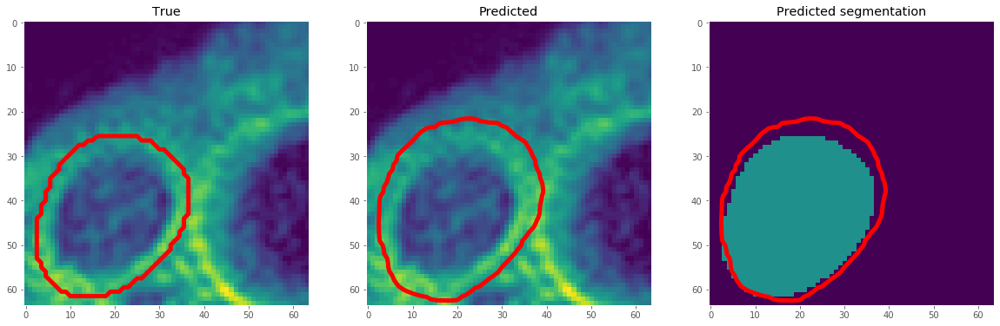

In [379]:
ix = 90

fig, ax = plt.subplots(1, 3, figsize=(20, 10))
ax[0].imshow(X_valid[ix, ..., 0], cmap='viridis')
ax[0].contour(y_valid[ix].squeeze(), colors='r', levels=[0.5], linewidths=5)
ax[0].set_title('True')
ax[0].grid(False)

ax[1].imshow(X_valid[ix, ..., 0], cmap='viridis')
ax[1].contour(preds_valid[ix].squeeze(), colors='r', levels=[0.5], linewidths=5)
ax[1].set_title('Predicted')
ax[1].grid(False)

ax[2].imshow(y_valid[ix].squeeze(), vmin=0, vmax=2)
ax[2].contour(preds_valid[ix].squeeze(), colors='r', levels=[0.5], linewidths=5)
ax[2].set_title('Predicted segmentation')
ax[2].grid(False)

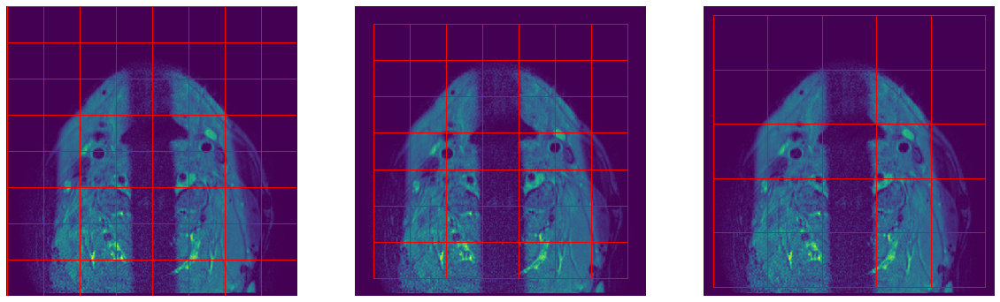

In [385]:
img_dcm = pydicom.read_file(images[0], force = True)
img_dcm.file_meta.TransferSyntaxUID = pydicom.uid.ImplicitVRLittleEndian
img = img_dcm.pixel_array
img_min = np.min(img) #!!!
img_max = np.max(img) #!!!
img_norm = np.copy((img - img_min)/(img_max - img_min)*255).astype(np.uint8)

img_test = img_norm[8:-8,8:-8]

plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.imshow(img_test)
for i in range (0, 8):
    for j in range (0, 8):
        plt.gca().add_patch(patches.Rectangle((64*i, 64*j), 64, 64, linewidth=1, edgecolor='r', facecolor='none'))
plt.axis('Off')


plt.subplot(1, 3, 2)
plt.imshow(img_test)
for i in range (0, 7):
    for j in range (0, 7):
        plt.gca().add_patch(patches.Rectangle((32+64*i, 32+64*j), 64, 64, linewidth=1, edgecolor='r', facecolor='none'))
plt.axis('Off')


plt.subplot(1, 3, 3)
plt.imshow(img_test)
for i in range (0, 5):
    for j in range (0, 5):
        plt.gca().add_patch(patches.Rectangle((16+96*i, 16+96*j), 96, 96, linewidth=1, edgecolor='r', facecolor='none'))
plt.axis('Off')
plt.show()

In [410]:
def detect4patches(img):
    
    M_0 = np.zeros((512, 512), dtype = np.float)
    M_1 = np.zeros((512, 512), dtype = np.float)
    M_2 = np.zeros((512, 512), dtype = np.float)

    for i in range (0, 8):
        for j in range (0, 8):
            img_patch = np.zeros((1, 64, 64, 1))
            img_patch[0, ..., 0] = img[64*i:64*i+64, 64*j:64*j+64].copy()
            img_patch_pred = model.predict(img_patch, verbose=1)
            M_0[64*i:64*i+64, 64*j:64*j+64] = img_patch_pred[0, ..., 0]

    for i in range (0, 7):
        for j in range (0, 7):
            img_patch = np.zeros((1, 64, 64, 1))
            img_patch[0, ..., 0] = img[32+64*i:32+64*i+64, 32+64*j:32+64*j+64].copy()
            img_patch_pred = model.predict(img_patch, verbose=1)
            M_1[32+64*i:32+64*i+64, 32+64*j:32+64*j+64] = img_patch_pred[0, ..., 0]

    for i in range (0, 5):
        for j in range (0, 5):
            img_patch = np.zeros((1, 64, 64, 1))
            img_patch[0, ..., 0] = res = cv2.resize(img[16+96*i:16+96*i+96, 16+96*j:16+96*j+96].copy(),
                                                    dsize=(64, 64), interpolation=cv2.INTER_CUBIC)
            mask_pred = model.predict(img_patch, verbose=1)
            img_patch_pred = cv2.resize(mask_pred[0, ..., 0],
                                        dsize=(96, 96), interpolation=cv2.INTER_CUBIC)
            M_2[16+96*i:16+96*i+96, 16+96*j:16+96*j+96] = img_patch_pred
            
    M_fuzed = morphology.remove_small_objects(M_0>0.5, 100)|morphology.remove_small_objects(M_1>0.5, 100)|morphology.remove_small_objects(M_2>0.5, 100)
    
    return M_fuzed

In [411]:
vessels_pred_simple = detect4patches(img_test)

1/1 [==============================] - 0s 5ms/step


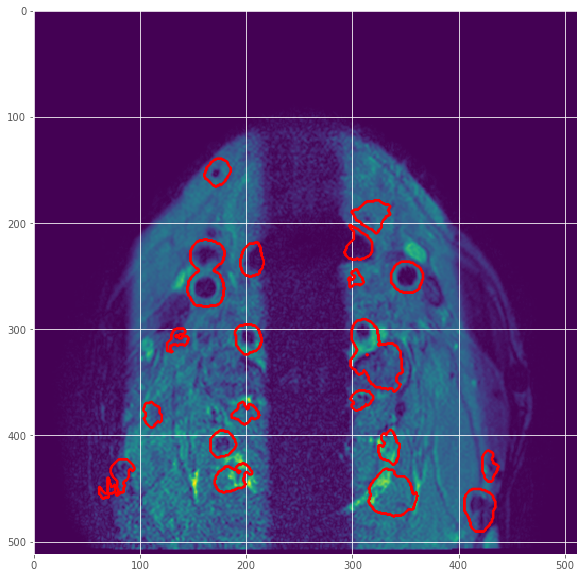

In [413]:
plt.figure(figsize=(10, 10))

plt.imshow(img_test)
plt.contour(vessels_pred_simple, colors = 'r')

plt.show()

In [416]:
img_3d = np.zeros((512, 512, 15), dtype = np.float)
mask_3d = np.zeros((512, 512, 15), dtype = np.float)

counter = 0

for img_name in img_names_test[:15]:
    
    img_dcm = pydicom.read_file(img_name, force = True)
    img_dcm.file_meta.TransferSyntaxUID = pydicom.uid.ImplicitVRLittleEndian
    img = img_dcm.pixel_array
    img_min = np.min(img) #!!!
    img_max = np.max(img) #!!!
    img_norm = np.copy((img - img_min)/(img_max - img_min)*255).astype(np.uint8)

    img_test = img_norm[8:-8,8:-8]
    
    mask_simple = detect4patches(img_test)
    
    img_3d[:, :, counter] = img_test
    mask_3d[:, :, counter] = mask_simple
    
    counter += 1

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


C:\Users\E.Lavrova\AppData\Local\conda\conda\envs\lisa\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]


1/1 [==============================] - 0s 6ms/step


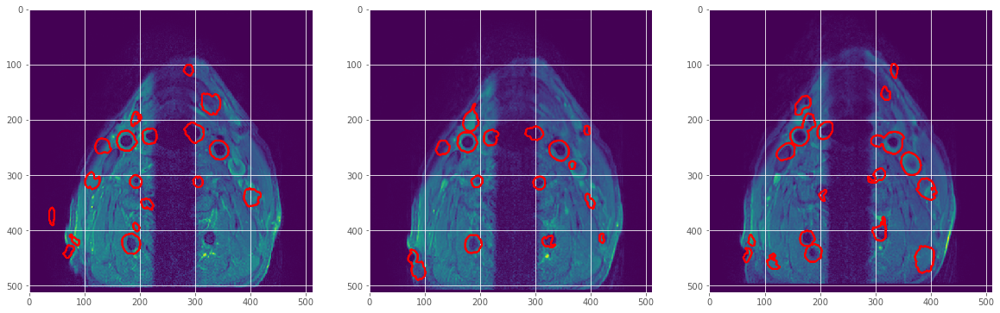

In [419]:
plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.imshow(img_3d[..., 0])
plt.contour(mask_3d[..., 0], colors = 'r')

plt.subplot(1, 3, 2)
plt.imshow(img_3d[..., 1])
plt.contour(mask_3d[..., 1], colors = 'r')

plt.subplot(1, 3, 3)
plt.imshow(img_3d[..., 2])
plt.contour(mask_3d[..., 2], colors = 'r')

plt.show()

In [424]:
def detect4multipatches(img):
    M = np.empty((512, 512, 113*113))
    M[:] = np.NaN
    c = 0

    for i in range (0, 113):
        for j in range (0, 113):
            img_patch = np.zeros((1, 64, 64, 1))
            img_patch[0, ..., 0] = img[4*i:4*i+64, 4*j:4*j+64].copy()
            img_patch_pred = model.predict(img_patch, verbose=1)
            M[4*i:4*i+64, 4*j:4*j+64, c] = img_patch_pred[0, ..., 0]
            c += 1
            
    M_concord = np.nanmean(M, axis = 2)
            
    return M_concord

In [425]:
img_3d_multi = np.zeros((512, 512, 15), dtype = np.float)
mask_3d_multi = np.zeros((512, 512, 15), dtype = np.float)

counter = 0

for img_name in img_names_test[:15]:
    
    img_dcm = pydicom.read_file(img_name, force = True)
    img_dcm.file_meta.TransferSyntaxUID = pydicom.uid.ImplicitVRLittleEndian
    img = img_dcm.pixel_array
    img_min = np.min(img) #!!!
    img_max = np.max(img) #!!!
    img_norm = np.copy((img - img_min)/(img_max - img_min)*255).astype(np.uint8)

    img_test = img_norm[8:-8,8:-8]
    
    mask = detect4multipatches(img_test)
    
    img_3d_multi[:, :, counter] = img_test
    mask_3d_multi[:, :, counter] = mask
    
    counter += 1

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 9ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 10ms/step


1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


C:\Users\E.Lavrova\AppData\Local\conda\conda\envs\lisa\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 0us/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - 0s 5ms/step


1/1 [==============================] - 0s 6ms/step


In [435]:
mask_3d_multi_half = mask_3d_multi > 0.5

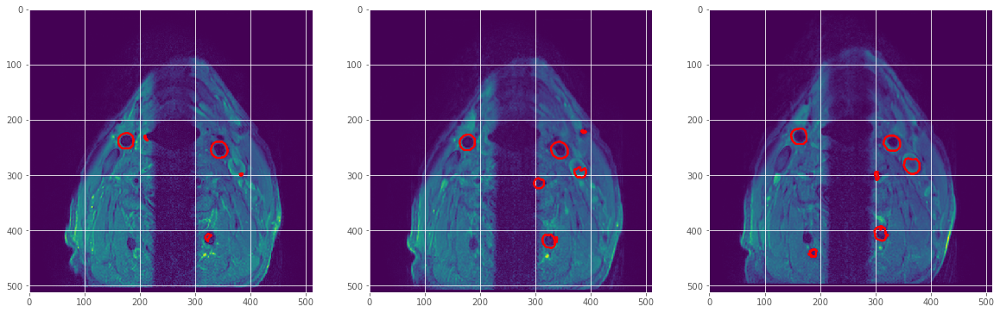

In [436]:
plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.imshow(img_3d_multi[..., 0])
plt.contour(mask_3d_multi_half[..., 0], colors = 'r')

plt.subplot(1, 3, 2)
plt.imshow(img_3d_multi[..., 1])
plt.contour(mask_3d_multi_half[..., 1], colors = 'r')

plt.subplot(1, 3, 3)
plt.imshow(img_3d_multi[..., 2])
plt.contour(mask_3d_multi_half[..., 2], colors = 'r')

plt.show()

In [437]:
mask_3d_multi_half_morph = morphology.remove_small_objects(mask_3d_multi_half, 100, connectivity=3)

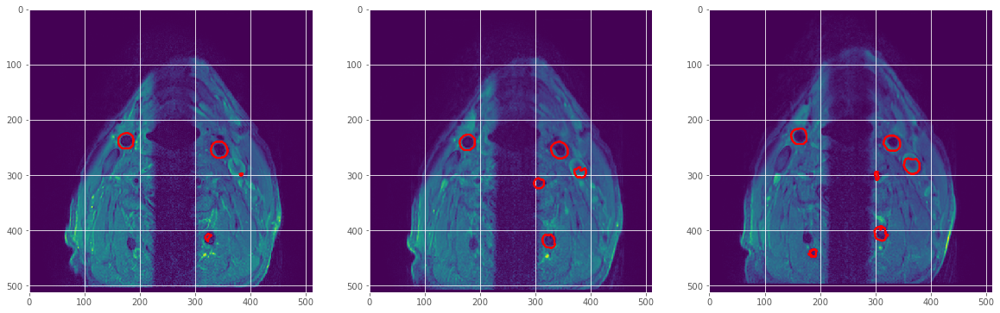

In [438]:
plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.imshow(img_3d_multi[..., 0])
plt.contour(mask_3d_multi_half_morph[..., 0], colors = 'r')

plt.subplot(1, 3, 2)
plt.imshow(img_3d_multi[..., 1])
plt.contour(mask_3d_multi_half_morph[..., 1], colors = 'r')

plt.subplot(1, 3, 3)
plt.imshow(img_3d_multi[..., 2])
plt.contour(mask_3d_multi_half_morph[..., 2], colors = 'r')

plt.show()

In [276]:
from skimage.filters import threshold_otsu, threshold_local

In [427]:
mask_3d_multi_otsu = np.zeros((512, 512, 15), dtype = np.float)

for i in range (0, 15):
    global_thresh = threshold_otsu(mask_3d_multi[..., i])
    mask_3d_multi_otsu[..., i] = (mask_3d_multi[..., i]>global_thresh)

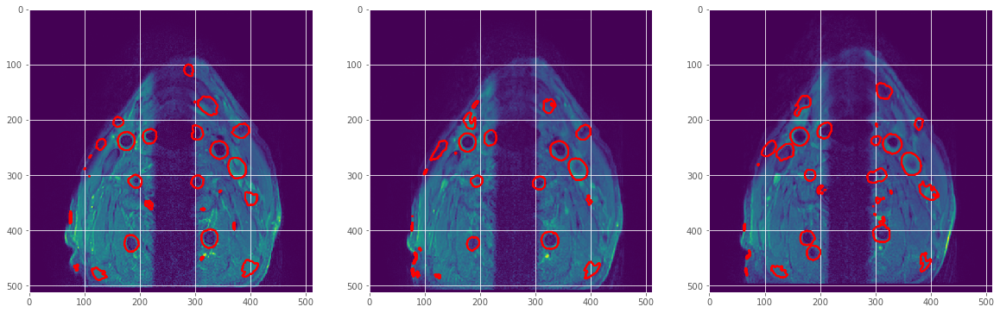

In [428]:
plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.imshow(img_3d_multi[..., 0])
plt.contour(mask_3d_multi_otsu[..., 0], colors = 'r')

plt.subplot(1, 3, 2)
plt.imshow(img_3d_multi[..., 1])
plt.contour(mask_3d_multi_otsu[..., 1], colors = 'r')

plt.subplot(1, 3, 3)
plt.imshow(img_3d_multi[..., 2])
plt.contour(mask_3d_multi_otsu[..., 2], colors = 'r')

plt.show()

In [450]:
mask_3d_multi_otsu_morph = morphology.remove_small_objects(mask_3d_multi_otsu.astype(bool), 250, connectivity=3)

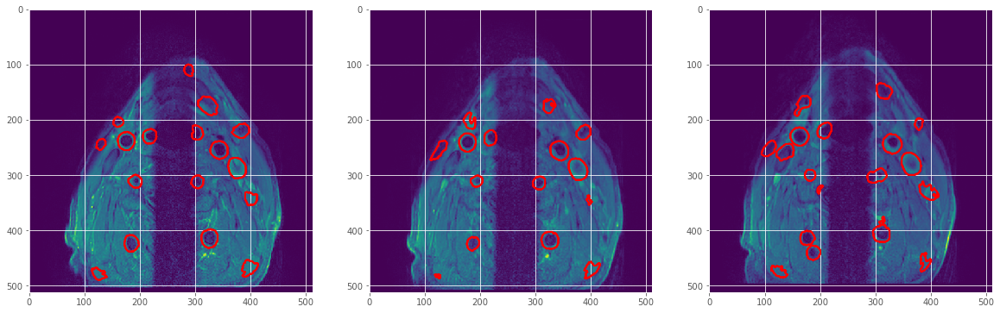

In [451]:
plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.imshow(img_3d_multi[..., 0])
plt.contour(mask_3d_multi_otsu_morph[..., 0], colors = 'r')

plt.subplot(1, 3, 2)
plt.imshow(img_3d_multi[..., 1])
plt.contour(mask_3d_multi_otsu_morph[..., 1], colors = 'r')

plt.subplot(1, 3, 3)
plt.imshow(img_3d_multi[..., 2])
plt.contour(mask_3d_multi_otsu_morph[..., 2], colors = 'r')

plt.show()

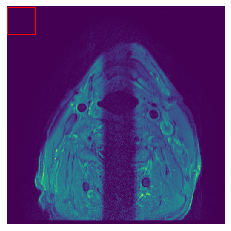

In [441]:
plt.imshow(img_3d_multi[..., 0])
for i in range (0, 1):
    for j in range (0, 1):
        plt.gca().add_patch(patches.Rectangle((64*i, 64*j), 64, 64, linewidth=1, edgecolor='r', facecolor='none'))
plt.axis('Off')
plt.show()

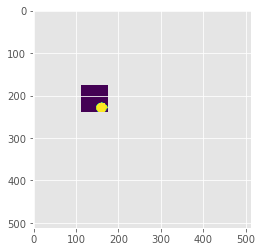

In [447]:
plt.imshow(M[..., 5000], vmin = 0, vmax = 1)
plt.show()

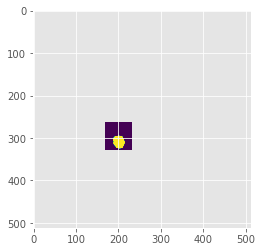

In [448]:
plt.imshow(M[..., 7500], vmin = 0, vmax = 1)
plt.show()

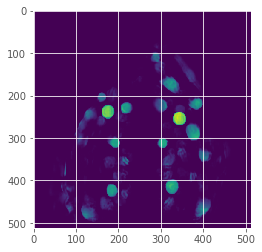

In [449]:
plt.imshow(mask_3d_multi[..., 0])
plt.show()